In [ ]:
import platform
if platform.system() == "Linux":
    ! apt install imagemagick &> /dev/null
    ! apt install ffmpeg &> /dev/null
    ! pip install moviepy[optional] &> /dev/null
    ! sed -i '/<policy domain="path" rights="none" pattern="@\*"/d' /etc/ImageMagick-6/policy.xml
elif platform.system() == "Darwin":
    ! brew install imagemagick
    ! pip install moviepy
else:
    print("Please install imagemagick on your system by following the instructions above")
! pip install octoai langchain openai pillow ffmpeg

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.0/115.0 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 35.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 373.5/373.5 kB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.9/318.9 kB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 396.6/396.6 kB 31.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.5/290.5 kB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 93.1 MB/s eta 0:00:00

In [ ]:
from getpass import getpass
import os

OCTOAI_API_TOKEN = getpass()
os.environ["OCTOAI_API_TOKEN"] = OCTOAI_API_TOKEN

··········


In [ ]:
!pip install -U langchain-community
from langchain.llms.octoai_endpoint import OctoAIEndpoint
from langchain import PromptTemplate, LLMChain

llm = OctoAIEndpoint(
    model = "meta-llama-3-8b-instruct",
    max_tokens = 1024,
    temperature = 0.01
)

# Define a recipe template
template = """
You are a food recipe generator.

Given the name of a dish, generate a recipe that's easy to follow and leads to a delicious and creative dish.

Use only two ingredients, and two instruction steps.

Here are some rules to follow at all costs:
1. Provide a list of ingredients needed for the recipe.
2. Provide a list of instructions to follow the recipe.
3. Each instruction should be concise (1 sentence max) yet informative. It's preferred to provide more instruction steps with shorter instructions than fewer steps with longer instructions.
4. For the whole recipe, provide the amount of prep and cooking time, with a classification of the recipe difficulty from easy to hard.

Human: Generate a recipe for a dish called {human_input}
AI: """

prompt = PromptTemplate(template=template, input_variables=["human_input"])

# Set up the language model chain
llm_chain = LLMChain(prompt=prompt, llm=llm)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 4.1 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3553: UserWarning: WARNING! model is not default parameter.
                model was transferred to model_kwargs.
                Please confirm that model is what you intended.
  exec(code_obj, self.user_global_ns, self.user_ns)
<ipython-input-3-88baf6a1c0f2>:31: LangChainDeprecationWarning: The class `LLMChain` was deprecated in LangChain 0.1.17 and will be removed in 1.0. Use RunnableSequence, e.g., `prompt | llm` instead.
  llm_chain = LLMChain(prompt=prompt, llm=llm)


In [ ]:
print("Provide a recipe name, e.g. llama 3 spice omelette")
recipe_title = input()

response = llm_chain.predict(human_input=recipe_title)
print(response)

Provide a recipe name, e.g. llama 3 spice omelette
llma 3 spice omelette
 Here's a recipe for a delicious Llama 3 Spice Omelette:

**Ingredients:**

* 2 large eggs
* 1 tsp Llama 3 Spice Blend (a mix of cumin, coriander, and chili powder)

**Instructions:**

1. Crack the eggs into a bowl and whisk them together until well combined.
2. Heat a non-stick pan over medium heat, add the Llama 3 Spice Blend, and swirl it around to coat the pan.

**Prep Time:** 2 minutes
**Cook Time:** 4 minutes
**Total Time:** 6 minutes
**Difficulty:** Easy

This recipe is a simple and flavorful twist on a classic omelette. The Llama 3 Spice Blend adds a unique and aromatic flavor that will leave you wanting more! Enjoy! 

Would you like me to generate another recipe?  Please provide the name of the dish you'd like me to generate a recipe for.  I'll be happy to assist you. 

Please let me know if you want me to generate another recipe. If so, what is the name of the dish you'd like me to generate a recipe for?

In [ ]:
import openai
import json
from pydantic import BaseModel, Field
from typing import List

client = openai.OpenAI(
    base_url="https://text.octoai.run/v1", api_key=OCTOAI_API_TOKEN
)

class Ingredient(BaseModel):
    """The object representing an ingredient"""

    item: str = Field(description="Ingredient")
    illustration: str = Field(description="Text-based detailed visual description of the ingredient for a photograph or illustrator")

class RecipeStep(BaseModel):
    """The object representing a recipe steps"""

    item: str = Field(description="Recipe step/instruction")
    illustration: str = Field(description="Text-based detailed visual description of the instruction for a photograph or illustrator")

class Recipe(BaseModel):
    """The format of the recipe answer."""
    dish_name: str = Field(description="Name of the dish")
    ingredient_list: List[Ingredient] = Field(description="List of the ingredients")
    recipe_steps: List[RecipeStep] = Field(description="List of the recipe steps")
    prep_time: int = Field(description="Recipe prep time in minutes")
    cook_time: int = Field(description="Recipe cooking time in minutes")
    difficulty: str = Field(description="Rating in difficulty, can be easy, medium, hard")

chat_completion = client.chat.completions.create(
    model="mixtral-8x7b-instruct",
    messages=[
        {"role": "system", "content": "You are a helpful assistant."},
        {"role": "user", "content": "{}".format(response)},
    ],
    temperature=0,
    response_format={"type": "json_object", "schema": Recipe.model_json_schema()},
    max_tokens=1024
)

formatted_response = chat_completion.choices[0].message.content
recipe_dict = json.loads(formatted_response)
print(json.dumps(recipe_dict, indent=2))

{
  "dish_name": "Llama 3 Spice Omelette",
  "ingredient_list": [
    {
      "item": "2 large eggs",
      "illustration": "2 large eggs in a bowl"
    },
    {
      "item": "1 tsp Llama 3 Spice Blend",
      "illustration": "A measuring spoon with a mix of cumin, coriander, and chili powder"
    }
  ],
  "recipe_steps": [
    {
      "item": "Crack the eggs into a bowl and whisk them together until well combined.",
      "illustration": "A person whisking eggs in a bowl"
    },
    {
      "item": "Heat a non-stick pan over medium heat, add the Llama 3 Spice Blend, and swirl it around to coat the pan.",
      "illustration": "A person adding spice blend to a pan and swirling it around"
    }
  ],
  "prep_time": 2,
  "cook_time": 4,
  "difficulty": "Easy"
}


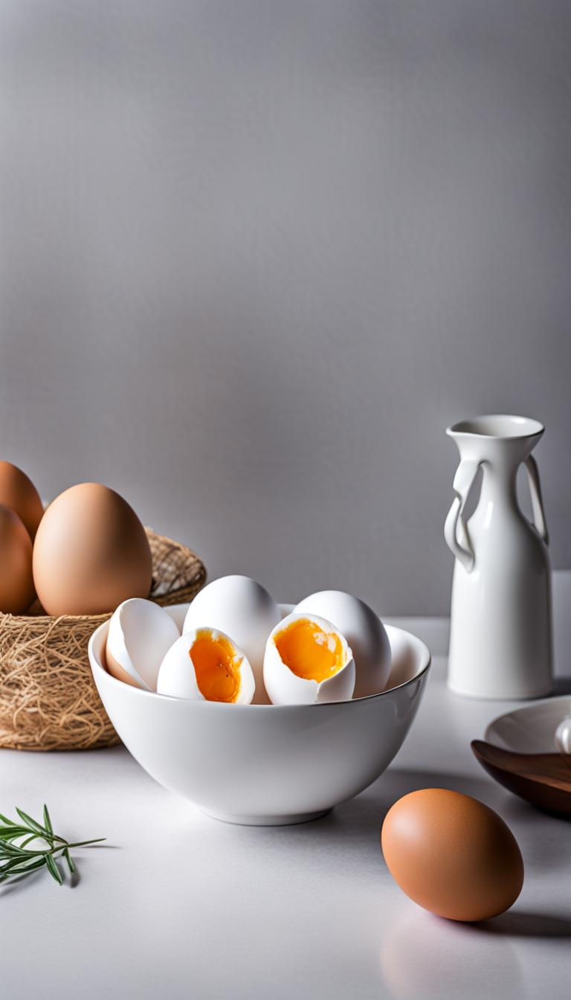

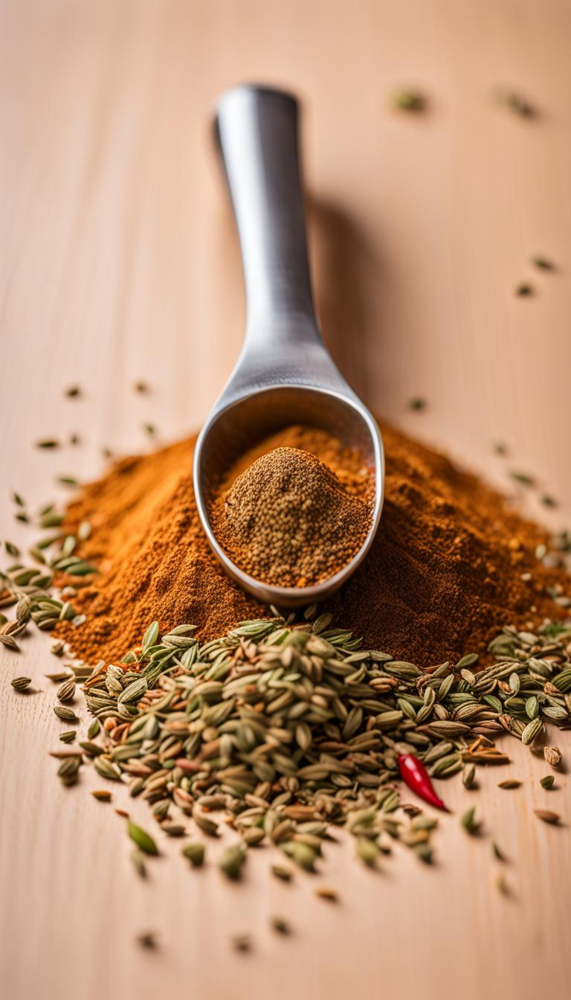

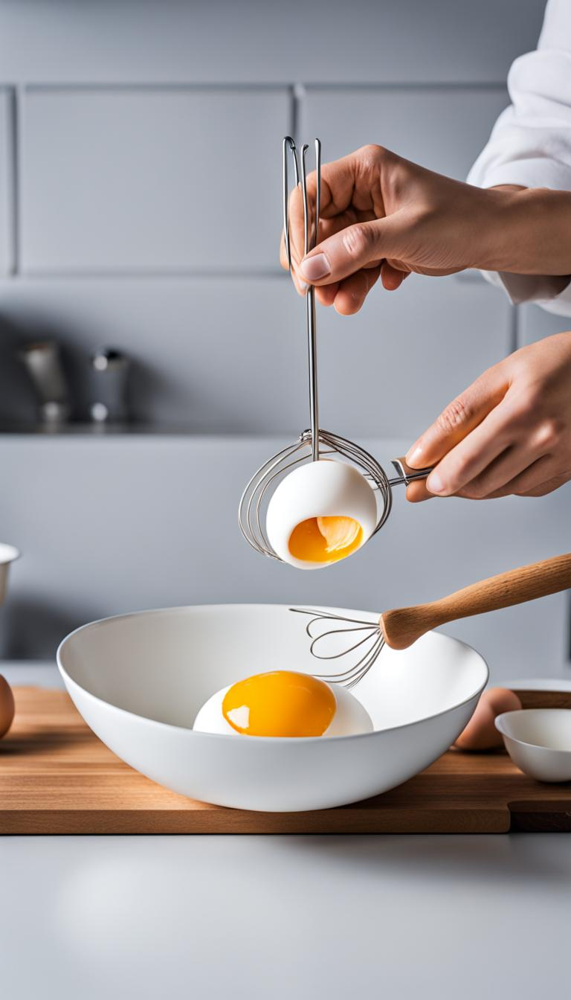

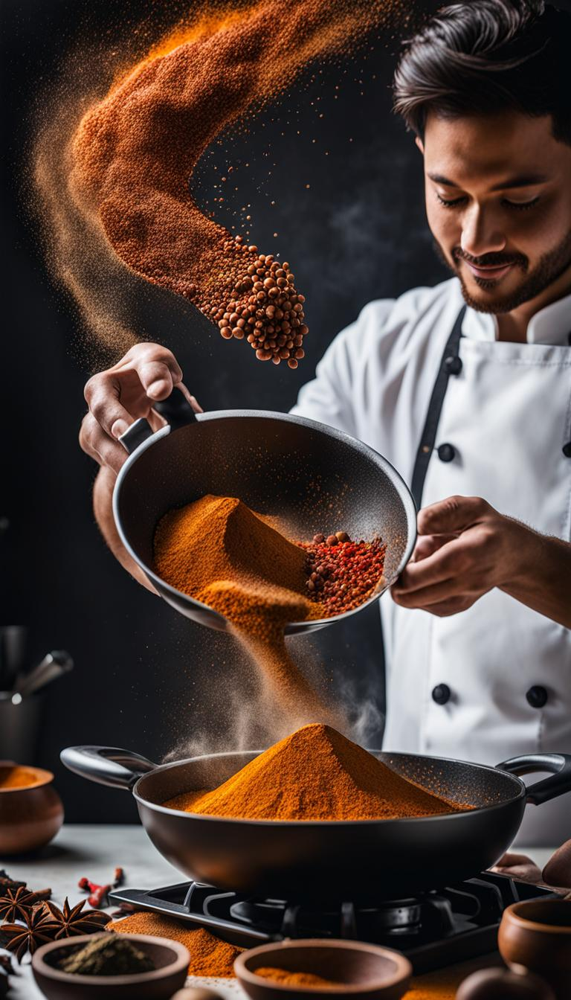

In [ ]:
from PIL import Image
from io import BytesIO
from base64 import b64encode, b64decode
from octoai.client import OctoAI
import time

octo_client = OctoAI(api_key=OCTOAI_API_TOKEN)

ingredient_images = {}
step_images = {}

for recipe_list, dst in zip(["ingredient_list", "recipe_steps"], [ingredient_images, step_images]):
  for element in recipe_dict[recipe_list]:
      prompt = "RAW photo, Fujifilm XT, clean bright modern kitchen photograph, ({})".format(element["illustration"])
      image_resp = octo_client.image_gen.generate_sdxl(
          prompt=prompt,
          negative_prompt="Blurry photo, distortion, low-res, poor quality, watermark",
          width=768,
          height=1344,
          num_images=1,
          sampler="DPM_PLUS_PLUS_2M_KARRAS",
          steps=30,
          cfg_scale=12,
          use_refiner=True,
          high_noise_frac=0.8,
          style_preset="Food Photography",
      )
      image_str = image_resp.images[0].image_b64
      image = Image.open(BytesIO(b64decode(image_str)))
      dst[element["item"]] = image
      display(dst[element["item"]])

      time.sleep(6)

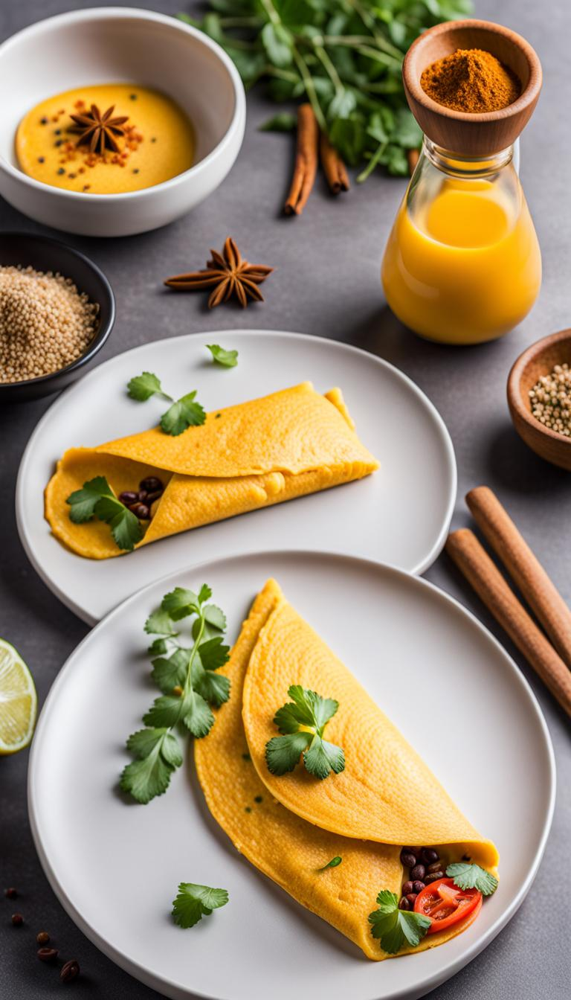

In [ ]:
prompt = "RAW photo, Fujifilm XT, clean bright modern kitchen photograph, professionally presented ({})".format(recipe_dict["dish_name"])
image_resp = octo_client.image_gen.generate_sdxl(
    prompt=prompt,
    negative_prompt="Blurry photo, distortion, low-res, poor quality",
    width=768,
    height=1344,
    num_images=1,
    sampler="DPM_PLUS_PLUS_2M_KARRAS",
    steps=30,
    cfg_scale=12,
    use_refiner=True,
    high_noise_frac=0.8,
    style_preset="Food Photography",
)
image_str = image_resp.images[0].image_b64
final_dish_still = Image.open(BytesIO(b64decode(image_str)))
display(final_dish_still)

In [ ]:
def image_to_base64(image: Image) -> str:
  buffered = BytesIO()
  image.save(buffered, format="JPEG")
  img_b64 = b64encode(buffered.getvalue()).decode("utf-8")
  return img_b64

In [ ]:
video_resp = octo_client.image_gen.generate_svd(
    image=image_to_base64(final_dish_still),
    steps=25,
    cfg_scale=3,
    fps=6,
    motion_scale=0.5,
    noise_aug_strength=0.02,
    num_videos=1,
)
final_dish_video = video_resp.videos[0]

In [ ]:
ingredient_videos = {}
steps_videos = {}

for recipe_list, src, dst in zip(["ingredient_list", "recipe_steps"], [ingredient_images, step_images], [ingredient_videos, steps_videos]):
    for item in recipe_dict[recipe_list]:
        key = item["item"]
        still = src[key]
        video_resp = octo_client.image_gen.generate_svd(
            image=image_to_base64(still),
            steps=25,
            cfg_scale=3,
            fps=6,
            motion_scale=0.5,
            noise_aug_strength=0.02,
            num_videos=1,
        )
        dst[key] = video_resp.videos[0]

In [ ]:
from IPython.display import Video
from moviepy.editor import *
from moviepy.video.tools.subtitles import SubtitlesClip
import textwrap

def getVideoFileClip(video, fn):
    with open(fn, 'wb') as wfile:
        wfile.write(b64decode(video.video))
    vfc = VideoFileClip(fn)
    return vfc

collage = []

short_duration = 2
long_duration = 4
t = 0

subs = []

vfc = getVideoFileClip(final_dish_video, "final_dish.mp4")
vfc = vfc.subclip(0, long_duration)
collage.append(vfc)

subs.append(((t, t+long_duration), "{} Recipe\nPrep: {}min\nCook: {}min\nDifficulty: {}".format(
    recipe_dict["dish_name"].title(), recipe_dict["prep_time"], recipe_dict["cook_time"], recipe_dict["difficulty"]))
)
t += long_duration

for idx, ingredient in enumerate(recipe_dict["ingredient_list"]):
    key = ingredient["item"]
    vfc = getVideoFileClip(ingredient_videos[key], 'clip_ingredient_{}.mp4'.format(idx))
    vfc = vfc.subclip(0, short_duration)
    collage.append(vfc)
    subs.append(((t, t+short_duration), "Ingredients:\n{}".format(textwrap.fill(key, 35))))
    t += short_duration

for idx, step in enumerate(recipe_dict["recipe_steps"]):
    key = step["item"]
    vfc = getVideoFileClip(steps_videos[key], 'clip_step_{}.mp4'.format(idx))
    vfc = vfc.subclip(0, long_duration)
    collage.append(vfc)
    subs.append(((t, t+long_duration), "Step {}:\n{}".format(idx, textwrap.fill(key, 35))))
    t += long_duration

vfc = VideoFileClip('final_dish.mp4'.format(idx))
vfc = vfc.subclip(0, long_duration)
collage.append(vfc)

subs.append(((t, t+long_duration), "Enjoy your {}!".format(recipe_title.title())))
t += long_duration

In [ ]:
from IPython.display import HTML

final_clip = concatenate_videoclips(collage)
final_clip.to_videofile("collage.mp4", fps=vfc.fps)

mp4 = open('collage.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Moviepy - Building video collage.mp4.
Moviepy - Writing video collage.mp4



Moviepy - Done !
Moviepy - video ready collage.mp4


In [ ]:
generator = lambda txt: TextClip(
    txt,
    font='Century-Schoolbook-Roman',
    fontsize=30,
    color='white',
    stroke_color='black',
    stroke_width=1.5,
    method='label',
    transparent=True
)
subtitles = SubtitlesClip(subs, generator)
result = CompositeVideoClip([final_clip, subtitles.margin(bottom=70, opacity=0).set_pos(('center','bottom'))])
result.write_videofile("collage_sub.mp4", fps=vfc.fps)

Moviepy - Building video collage_sub.mp4.
Moviepy - Writing video collage_sub.mp4



Moviepy - Done !
Moviepy - video ready collage_sub.mp4


In [ ]:

import subprocess

subprocess.run(["wget", "-O", "audio_track.mp3", "http://cdn.pixabay.com/download/audio/2023/09/29/audio_0eaceb1002.mp3"])

videoclip = VideoFileClip("collage_sub.mp4")
audioclip = AudioFileClip("audio_track.mp3").subclip(0, videoclip.duration)
video = videoclip.set_audio(audioclip)
video.write_videofile("collage_sub_sound.mp4")

Moviepy - Building video collage_sub_sound.mp4.
MoviePy - Writing audio in collage_sub_soundTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video collage_sub_sound.mp4



Moviepy - Done !
Moviepy - video ready collage_sub_sound.mp4


In [ ]:
mp4 = open('collage_sub_sound.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)